# TITLE

## Sarbpreet Ghotra & Sameer Ladha

## DS8007 Final Project


### Abstract


Metropolitan regions across the globe encounter difficulties in handling and diminishing crime rates, which can greatly influence community safety and social unity. Toronto, being one of the largest cities in North America, is no different. This dataset allows us to delve deeper into the intricate relationship between crime rates, neighborhood dynamics and public safety initiatives. Crime not only threatens the safety of individuals and communities but also reduces trust in public institutions and hinders economic development. Visualizing the dynamics, patterns, and trends of significant crimes within the city is vital for developing efficient law enforcement strategies and public policies. Furthermore, through geospatial analysis, light could be shed on potential hotspots and areas that are in need of targeted support.


# NOTES for us to make sure we do everything we said wed do lol

- We are looking for relationship between crime rates, neighbourhood dynamics and public safety initiatives.
- dynamics, patterns, and trends of significant crimes
- geospatial analysis, light could be shed on potential hotspots and areas that are in need of targeted support
- reveal fundamental patterns and trends
- comprehending the spatial and temporal spread of crimes can aid in pinpointing high-risk zones


### Introduction


In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import folium
from folium.plugins import HeatMap
import seaborn as sns

### Data Preprocessing

Thorough preprocessing and cleaning of the data to ensure its quality and integrity.
Documentation of the preprocessing steps undertaken, including handling missing values, outliers, and any transformations applied to the data.


In [2]:
filename = "/Users/sameerladha/Documents/School/Masters of Science - Data Science and Analytics/S2/DS8007 - Advanced Data Visualization/Final Project DS8007/Major_Crime_Indicators_Open_Data.csv"
dataframemain = pd.read_csv(filename)

# Show basic data description
dataframemain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 372899 entries, 0 to 372898
Data columns (total 31 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   X                  372899 non-null  float64
 1   Y                  372899 non-null  float64
 2   OBJECTID           372899 non-null  int64  
 3   EVENT_UNIQUE_ID    372899 non-null  object 
 4   REPORT_DATE        372899 non-null  object 
 5   OCC_DATE           372899 non-null  object 
 6   REPORT_YEAR        372899 non-null  int64  
 7   REPORT_MONTH       372899 non-null  object 
 8   REPORT_DAY         372899 non-null  int64  
 9   REPORT_DOY         372899 non-null  int64  
 10  REPORT_DOW         372899 non-null  object 
 11  REPORT_HOUR        372899 non-null  int64  
 12  OCC_YEAR           372788 non-null  float64
 13  OCC_MONTH          372788 non-null  object 
 14  OCC_DAY            372788 non-null  float64
 15  OCC_DOY            372788 non-null  float64
 16  OC

### Data Cleaning


In [3]:
# Drop nan values
dataframemain.dropna(inplace=True)
dataframemain.info()

<class 'pandas.core.frame.DataFrame'>
Index: 372788 entries, 0 to 372898
Data columns (total 31 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   X                  372788 non-null  float64
 1   Y                  372788 non-null  float64
 2   OBJECTID           372788 non-null  int64  
 3   EVENT_UNIQUE_ID    372788 non-null  object 
 4   REPORT_DATE        372788 non-null  object 
 5   OCC_DATE           372788 non-null  object 
 6   REPORT_YEAR        372788 non-null  int64  
 7   REPORT_MONTH       372788 non-null  object 
 8   REPORT_DAY         372788 non-null  int64  
 9   REPORT_DOY         372788 non-null  int64  
 10  REPORT_DOW         372788 non-null  object 
 11  REPORT_HOUR        372788 non-null  int64  
 12  OCC_YEAR           372788 non-null  float64
 13  OCC_MONTH          372788 non-null  object 
 14  OCC_DAY            372788 non-null  float64
 15  OCC_DOY            372788 non-null  float64
 16  OCC_DOW

### Exploratory Data Analysis

Comprehensive EDA exploring the datasets, including summary statistics, data distributions, and visualizations to identify patterns and insights.


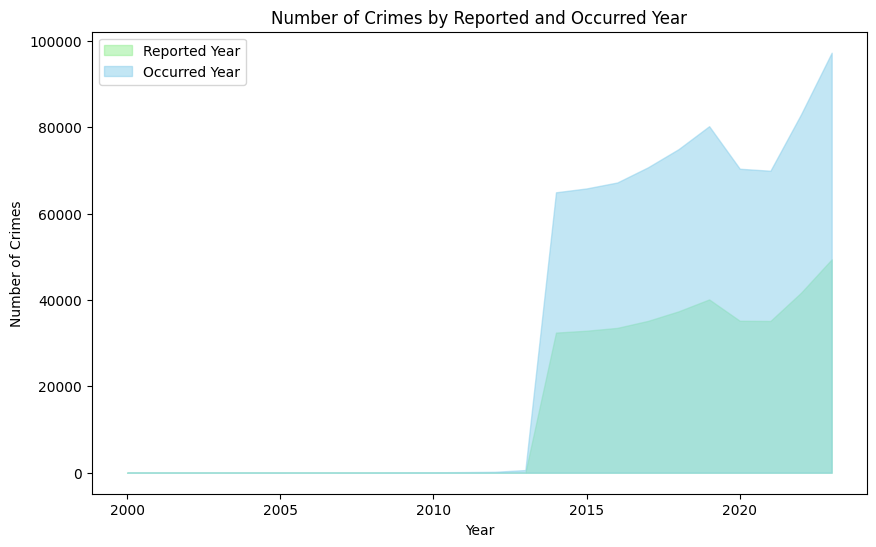

In [4]:
df = dataframemain.copy()

# Aggregate the number of reports and occurrences by year
report_year_counts = df["REPORT_YEAR"].value_counts().sort_index()
occ_year_counts = df["OCC_YEAR"].value_counts().sort_index()

report_month_counts = df["REPORT_MONTH"].value_counts().sort_index()
occ_month_counts = df["OCC_MONTH"].value_counts().sort_index()

all_years = sorted(set(report_year_counts.index).union(set(occ_year_counts.index)))
all_months = sorted(set(report_month_counts.index).union(set(occ_month_counts.index)))

report_year_counts = report_year_counts.reindex(all_years, fill_value=0)
occ_year_counts = occ_year_counts.reindex(all_years, fill_value=0)
report_month_counts = report_month_counts.reindex(all_months, fill_value=0)
occ_month_counts = occ_month_counts.reindex(all_months, fill_value=0)

plt.figure(figsize=(10, 6))

plt.fill_between(
    all_years,
    report_year_counts.values,
    label="Reported Year",
    color="lightgreen",
    alpha=0.5,
)
plt.fill_between(
    all_years,
    occ_year_counts.values + report_year_counts.values,
    label="Occurred Year",
    color="skyblue",
    alpha=0.5,
)
plt.title("Number of Crimes by Reported and Occurred Year")
plt.xlabel("Year")
plt.ylabel("Number of Crimes")
plt.legend(loc="upper left")

plt.show()

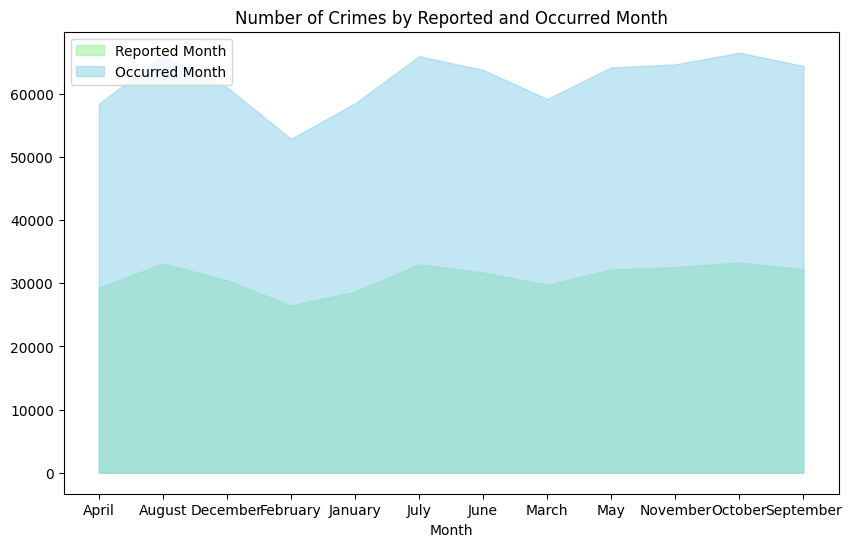

In [5]:
df = dataframemain.copy()

# Create the figure for Number of Crimes per Month
plt.figure(figsize=(10, 6))

plt.fill_between(
    all_months,
    report_month_counts.values,
    label="Reported Month",
    color="lightgreen",
    alpha=0.5,
)
plt.fill_between(
    all_months,
    occ_month_counts.values + report_month_counts.values,
    label="Occurred Month",
    color="skyblue",
    alpha=0.5,
)
plt.title("Number of Crimes by Reported and Occurred Month")
plt.xlabel("Month")
plt.legend(loc="upper left")

plt.show()

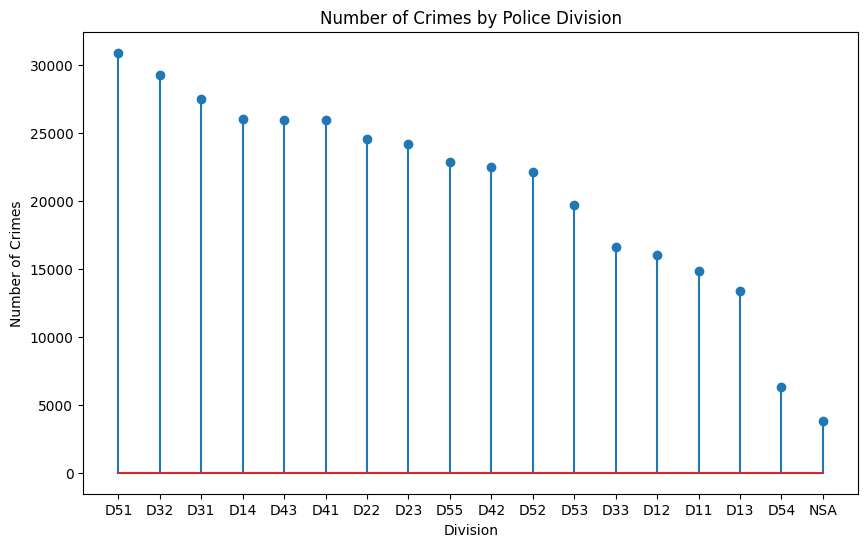

In [6]:
df = dataframemain.copy()

divisions = df["DIVISION"].value_counts()
plt.figure(figsize=(10, 6))
plt.stem(divisions.index, divisions.values)
plt.title("Number of Crimes by Police Division")
plt.ylabel("Number of Crimes")
plt.xlabel("Division")
plt.show()

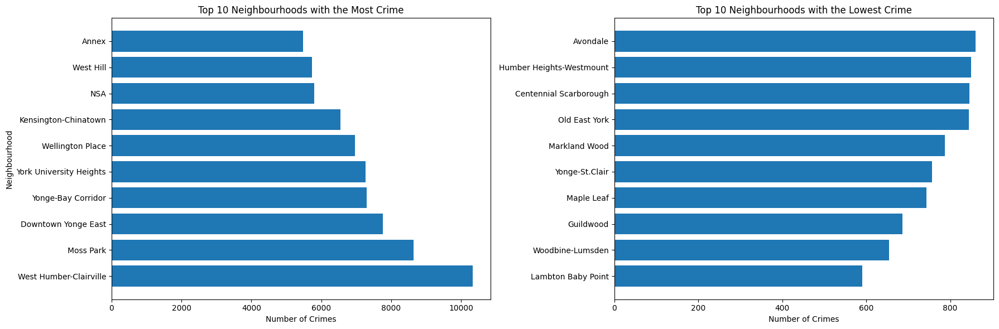

In [7]:
df = dataframemain.copy()

fig, axs = plt.subplots(1, 2, figsize=(18, 6))
top_10_neighbourhoods = df["NEIGHBOURHOOD_158"].value_counts().nlargest(10)
axs[0].barh(top_10_neighbourhoods.index, top_10_neighbourhoods.values)
axs[0].set_title("Top 10 Neighbourhoods with the Most Crime")
axs[0].set_xlabel("Number of Crimes")
axs[0].set_ylabel("Neighbourhood")


bottom_10_neighbourhoods = df["NEIGHBOURHOOD_158"].value_counts().nsmallest(10)
axs[1].barh(bottom_10_neighbourhoods.index, bottom_10_neighbourhoods.values)
axs[1].set_title("Top 10 Neighbourhoods with the Lowest Crime")
axs[1].set_xlabel("Number of Crimes")
plt.tight_layout()
plt.show()

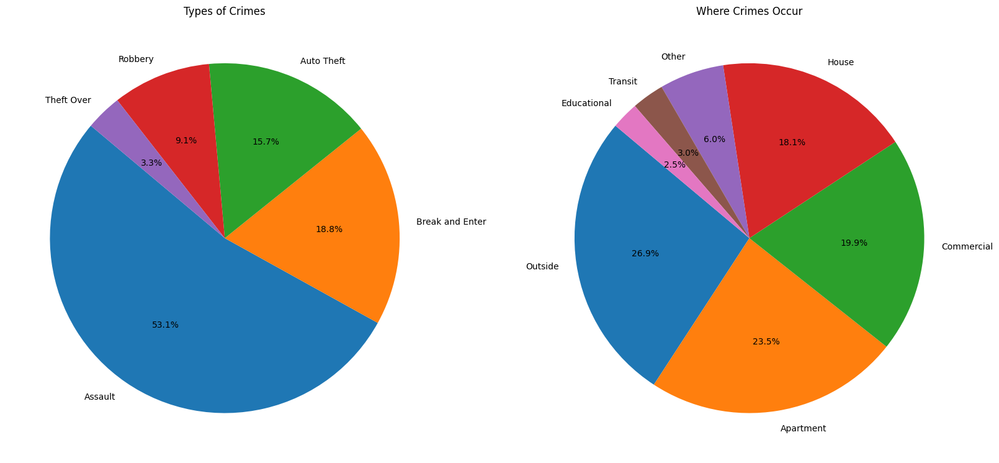

In [8]:
df = dataframemain.copy()

fig, axs = plt.subplots(1, 2, figsize=(20, 10))

# Types of Crimes
crime_counts = df["MCI_CATEGORY"].value_counts().sort_values(ascending=False)
axs[0].pie(crime_counts, labels=crime_counts.index, autopct="%1.1f%%", startangle=140)
axs[0].set_title("Types of Crimes")

# Where Crimes Occur
premises_counts = df["PREMISES_TYPE"].value_counts().sort_values(ascending=False)
axs[1].pie(
    premises_counts, labels=premises_counts.index, autopct="%1.1f%%", startangle=140
)
axs[1].set_title("Where Crimes Occur")

plt.show()

In [9]:
df = dataframemain.copy()

city_center_latitude = df["LAT_WGS84"].median()
city_center_longitude = df["LONG_WGS84"].median()

m = folium.Map(location=[city_center_latitude, city_center_longitude], zoom_start=12)

heat_data = [[row["LAT_WGS84"], row["LONG_WGS84"]] for index, row in df.iterrows()]

HeatMap(heat_data).add_to(m)
m

In [24]:
df = dataframemain.copy()

# Get the data for 2023
unique_years = df["REPORT_YEAR"].unique()

yearly_datasets = []
for year in unique_years:
    yearly_dataset = df[df["REPORT_YEAR"] == year]
    yearly_datasets.append(yearly_dataset)

year_index = np.where(unique_years == 2023)[0][0]

dataset_2023 = yearly_datasets[year_index]

# City center based on the median of the data
city_center_latitude = dataset_2023["LAT_WGS84"].median()
city_center_longitude = dataset_2023["LONG_WGS84"].median()

m = folium.Map(location=[city_center_latitude, city_center_longitude], zoom_start=12)
heat_data = [
    [row["LAT_WGS84"], row["LONG_WGS84"]] for index, row in dataset_2023.iterrows()
]
HeatMap(heat_data).add_to(m)
m

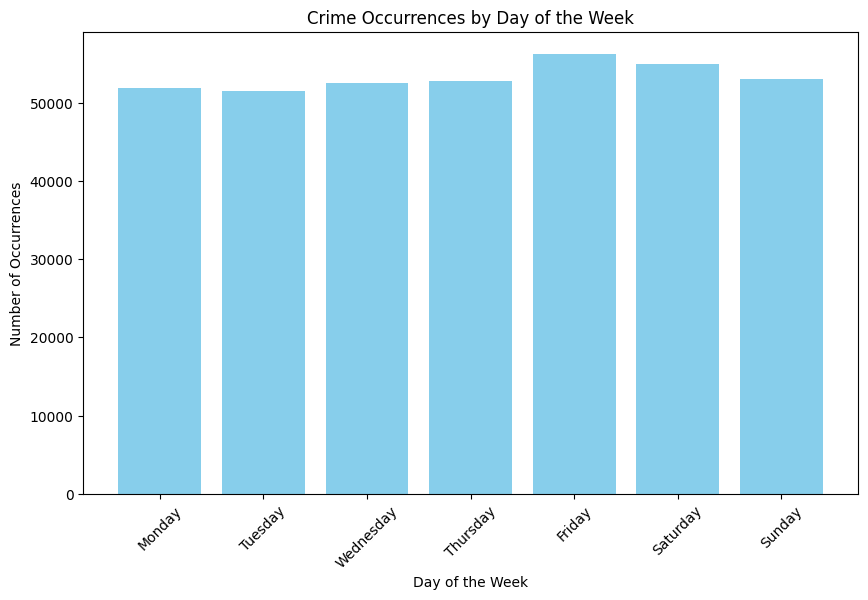

In [11]:
df = dataframemain.copy()

# Clean the 'OCC_DOW' column by stripping extra spaces
df["OCC_DOW"] = df["OCC_DOW"].str.strip()

# Ensure the days of the week are in the correct order
days_order = [
    "Monday",
    "Tuesday",
    "Wednesday",
    "Thursday",
    "Friday",
    "Saturday",
    "Sunday",
]

# Count the number of occurrences for each day of the week
occ_dow_counts = df["OCC_DOW"].value_counts().reindex(days_order)

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(occ_dow_counts.index, occ_dow_counts.values, color="skyblue")
plt.title("Crime Occurrences by Day of the Week")
plt.xlabel("Day of the Week")
plt.ylabel("Number of Occurrences")
plt.xticks(rotation=45)
plt.show()

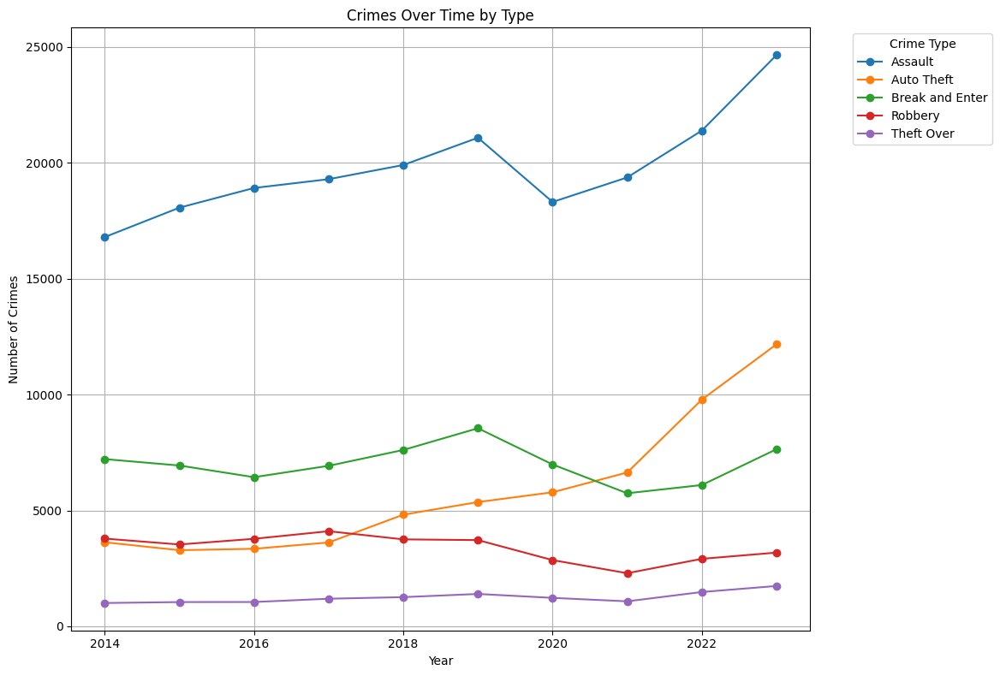

In [12]:
df = dataframemain.copy()

crime_over_time = (
    df.groupby(["REPORT_YEAR", "MCI_CATEGORY"]).size().unstack(fill_value=0)
)

plt.figure(figsize=(14, 8))
for category in crime_over_time.columns:
    plt.plot(
        crime_over_time.index, crime_over_time[category], label=category, marker="o"
    )

plt.title("Crimes Over Time by Type")
plt.xlabel("Year")
plt.ylabel("Number of Crimes")
plt.legend(title="Crime Type", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(True)
plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.show()

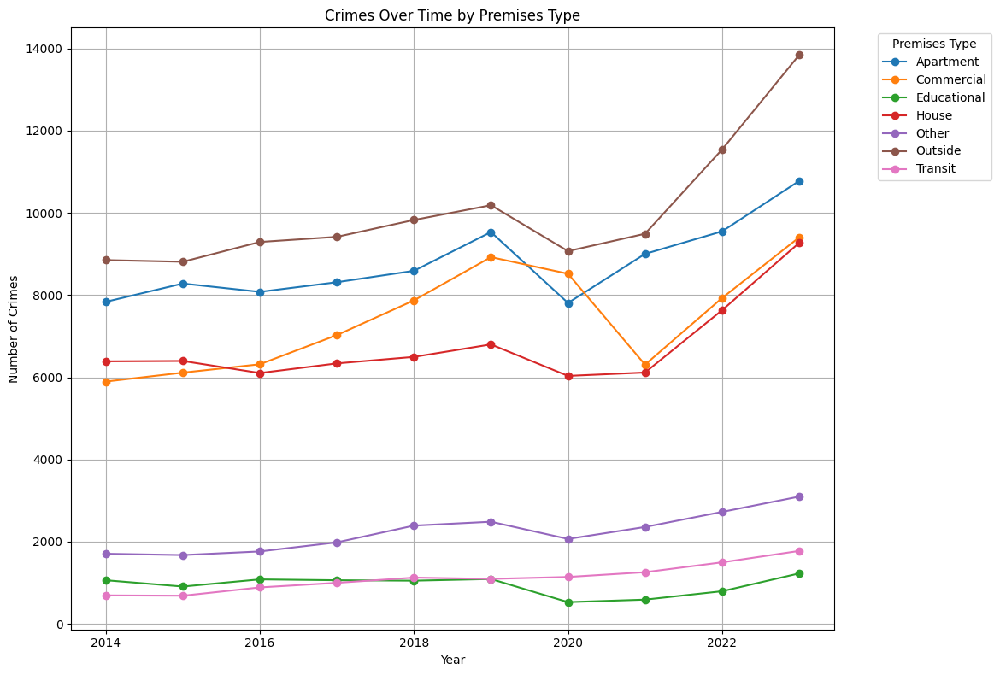

In [17]:
df = dataframemain.copy()

crimes_by_premises_over_time = (
    df.groupby(["REPORT_YEAR", "PREMISES_TYPE"]).size().unstack(fill_value=0)
)

plt.figure(figsize=(14, 8))
for premises_type in crimes_by_premises_over_time.columns:
    plt.plot(
        crimes_by_premises_over_time.index,
        crimes_by_premises_over_time[premises_type],
        label=premises_type,
        marker="o",
    )

plt.title("Crimes Over Time by Premises Type")
plt.xlabel("Year")
plt.ylabel("Number of Crimes")
plt.legend(title="Premises Type", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(True)
plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.show()

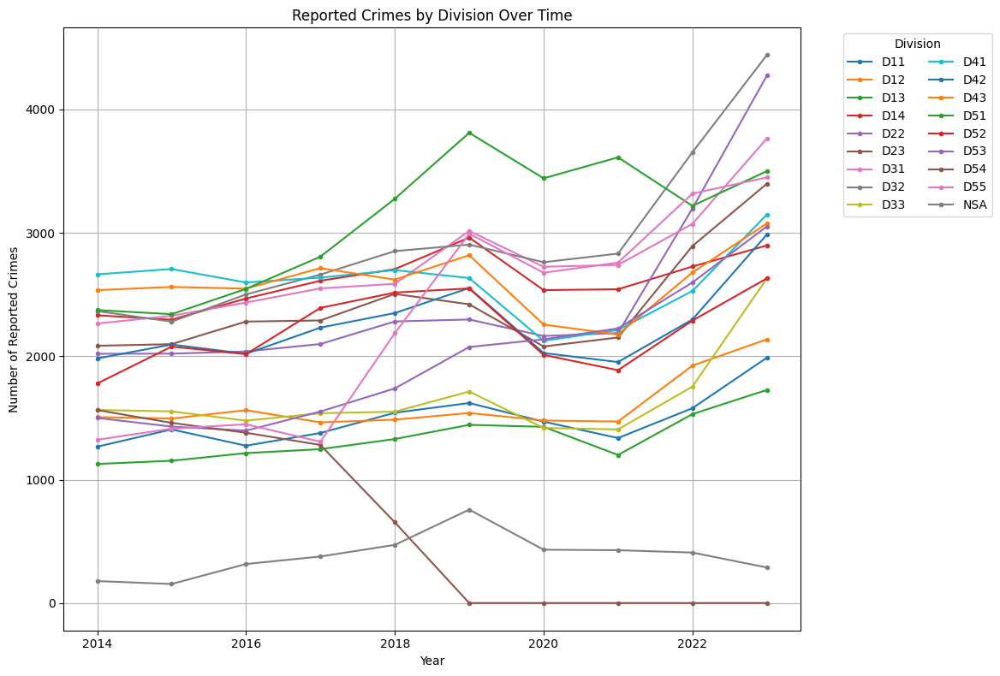

In [14]:
df = dataframemain.copy()

crimes_by_division_over_time = (
    df.groupby(["REPORT_YEAR", "DIVISION"]).size().unstack(fill_value=0)
)

plt.figure(figsize=(14, 8))
for division in crimes_by_division_over_time.columns:
    plt.plot(
        crimes_by_division_over_time.index,
        crimes_by_division_over_time[division],
        label=division,
        marker=".",
    )

plt.title("Reported Crimes by Division Over Time")
plt.xlabel("Year")
plt.ylabel("Number of Reported Crimes")
plt.legend(title="Division", bbox_to_anchor=(1.05, 1), loc="upper left", ncol=2)
plt.grid(True)
plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.show()

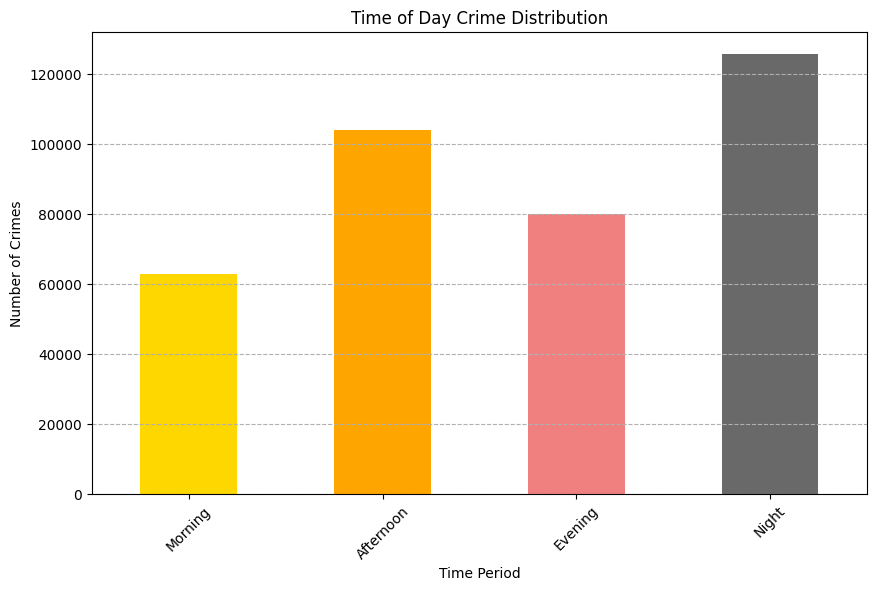

In [15]:
df = dataframemain.copy()

time_ranges = {
    "Morning": (6, 11),
    "Afternoon": (12, 17),
    "Evening": (18, 21),
    "Night": (22, 23),
    "Night": (0, 5),
}

colors = {
    "Morning": "gold",
    "Afternoon": "orange",
    "Evening": "lightcoral",
    "Night": "dimgray",
}


def assign_time_period(hour):
    for period, (start, end) in time_ranges.items():
        if start <= hour <= end:
            return period
    return "Night"


df["Time_Period"] = df["OCC_HOUR"].apply(assign_time_period)
time_period_counts = df["Time_Period"].value_counts().sort_index()
ordered_periods = ["Morning", "Afternoon", "Evening", "Night"]
time_period_counts = time_period_counts.reindex(ordered_periods)

plt.figure(figsize=(10, 6))
time_period_counts.plot(
    kind="bar", color=[colors[period] for period in time_period_counts.index]
)
plt.title("Time of Day Crime Distribution")
plt.xlabel("Time Period")
plt.ylabel("Number of Crimes")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--")
plt.show()

### Findings

Presentation of key findings from the EDA phase, highlighting any notable trends, correlations, or outliers discovered in the data and providing the detail of the problem that needs to be addressed using further visualization


### Results

Implementation of data visualization techniques to effectively communicate the findings to the audience.


### Conclusions

A concise summary of the project's outcomes, discussing the implications of the findings and any potential recommendations or future directions.
